# Analysis for 20230511-095813.xlsx

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
from ast import literal_eval
from typing import List
pd.set_option('display.max_columns', None)

In [2]:
excel_sheet_path = r'C:\python\personal\my-open\notebooks\20230511-095813\data\20230511-095813.xlsx'
data = pd.read_excel(excel_sheet_path, engine='openpyxl')

In [3]:
data.head()

,FolderName,rated_photovoltaic_kilowatts,simulation_time_series_resolution_in_minutes,energy_management_system_time_series_resolution_in_minutes,max_storage_asset_energy_in_kilowatt_hour,min_storage_asset_energy_in_kilowatt_hour,max_storage_asset_active_power_in_kilowatts,min_storage_asset_active_power_in_kilowatts,initial_storage_asset_energy_level_percentage,required_storage_asset_terminal_energy_level_percentage,storage_asset_absolute_active_power_in_kilowatts,storage_asset_degradation_ratio_in_euros_per_kilowatt_hour,storage_asset_charging_efficiency_percentage,storage_asset_charging_efficiency_for_the_optimizer_percentage,max_inside_degree_celsius,min_inside_degree_celsius,initial_inside_degree_celsius,max_consumed_electric_heating_kilowatts,max_consumed_electric_cooling_kilowatts,heat_pump_coefficient_of_performance,chiller_coefficient_of_performance,building_thermal_capacitance_in_kilowatts_hour_per_degree_celsius,building_thermal_resistance_in_degree_celsius_per_kilowatts,export_prices_in_euros_per_kilowatt_hour,demand_charge_in_euros_per_kilowatt,max_import_kilowatts,max_export_kilowatts,offered_kilowatts_in_frequency_response,max_frequency_response_state_of_charge,min_frequency_response_state_of_charge,frequency_response_price_in_euros_per_kilowatt_hour,grid_1_voltage_level_in_kilo_volts,grid_2_voltage_level_in_kilo_volts,grid_3_voltage_level_in_kilo_volts,transformer_apparent_power_in_mega_volt_ampere,length_from_bus_2_to_bus_3_in_km,blackout_start_time_in_hours,blackout_stop_time_in_hours,save_plots,photovoltaic_generation_data_file_path,electric_load_data_file_path,data_strategy,ambient_temperature_file_path,market,import_period_prices.P1,import_period_prices.P2,import_period_prices.P3,import_period_prices.P4,import_period_prices.P5,import_period_prices.P6,buses_voltage_angle_in_degrees,buses_active_power_in_kilowatts,buses_reactive_power_in_kilovolt_ampere_reactive,market_active_power_in_kilowatts,market_reactive_power_in_kilovolt_ampere_reactive,buses_voltage_in_per_unit,active_power_demand_in_kilowatts,revenue,active_power_demand_base_in_kilowatts,imported_active_power_in_kilowatts,exported_active_power_in_kilowatts,building_power_consumption_in_kilowatts
0,20230511-095902_1_Commercial-275-bed Hospital,400,1,15,500,0,500,0,4,50,NaN,NaN,100,100,25,21,21,400,400,3,1,500,0.0337,0.189,0,500,-500,0,0.6,0.4,0.0059,20,0.4,0.4,0.4,0.1,11,12.5,False,data/solar_radiation/pamplona/1_min/2022-01-01...,data/electric_loads/considered_building_types,MeteoNavarra,data/ambient_temperature/pamplona/20220115_amb...,Spanish,0.1395,0.1278,0.111,0.1014,0.0927,0.0871,"[[0.0, -2.3951697643387164, -3.259090153682367...","[[-288.1100621061704, 0.0, 250.71931560876405]...","[[-16.35650436202681, 0.0, 0.0], [-16.35650436...","[288.1100621061704, 288.1100621061704, 288.110...","[16.35650436202681, 16.35650436202681, 16.3565...","[[1.0, 0.9882421049296655, 0.8728775078644493]...","[6.553399999999999, 6.553399999999999, 6.55339...",837.49,"[6.553400000000001, 6.553400000000001, 6.55340...","[[499.9999999981634], [499.9999999981608], [49...","[[249.28068438939937], [246.71989086095172], [...","[[244.16591560715298], [246.72670913556766], [..."
1,20230511-095935_2_Commercial-275-bed Hospital,400,1,15,500,0,500,0,4,50,NaN,NaN,100,100,25,21,21,400,400,3,1,500,0.0337,0.189,0,500,-500,0,0.6,0.4,0.0059,20,0.4,0.4,0.4,0.1,11,12.5,False,data/solar_radiation/pamplona/1_min/2022-01-02...,data/electric_loads/considered_building_types,MeteoNavarra,data/ambient_temperature/pamplona/20220215_amb...,Spanish,0.1395,0.1278,0.111,0.1014,0.0927,0.0871,"[[0.0, -1.5797317440054035, -2.145666664095071...","[[-190.20332931710308, 0.0, 173.2503747170207]...","[[-7.093392131914574, 0.0, 0.0], [-7.093392131...","[190.20332931710308, 190.20332931710308, 190.2...","[7.093392131914574, 7.093392131914574, 7.09339...","[[1.0, 0.9925930000278556, 0.9167119360105046]...","[6.8292, 6.8292, 6.8292, 6.8292, 6.91179999999...",583.82,"[6.8292, 6.8292, 6.8292, 6.8292, 6.8292, 6.82

In [4]:
data.columns

Index(['FolderName', 'rated_photovoltaic_kilowatts',
       'simulation_time_series_resolution_in_minutes',
       'energy_management_system_time_series_resolution_in_minutes',
       'max_storage_asset_energy_in_kilowatt_hour',
       'min_storage_asset_energy_in_kilowatt_hour',
       'max_storage_asset_active_power_in_kilowatts',
       'min_storage_asset_active_power_in_kilowatts',
       'initial_storage_asset_energy_level_percentage',
       'required_storage_asset_terminal_energy_level_percentage',
       'storage_asset_absolute_active_power_in_kilowatts',
       'storage_asset_degradation_ratio_in_euros_per_kilowatt_hour',
       'storage_asset_charging_efficiency_percentage',
       'storage_asset_charging_efficiency_for_the_optimizer_percentage',
       'max_inside_degree_celsius', 'min_inside_degree_celsius',
       'initial_inside_degree_celsius',
       'max_consumed_electric_heating_kilowatts',
       'max_consumed_electric_cooling_kilowatts',
       'heat_pump_coefficien

In [5]:
# Excel gets the arrays as string so that we need to perform the following
for column in data.columns:
    try:
        data[column] = data[column].apply(literal_eval)
    except:
        print(f'Not possible to perform literal_eval in {column}')

Not possible to perform literal_eval in FolderName
Not possible to perform literal_eval in rated_photovoltaic_kilowatts
Not possible to perform literal_eval in simulation_time_series_resolution_in_minutes
Not possible to perform literal_eval in energy_management_system_time_series_resolution_in_minutes
Not possible to perform literal_eval in max_storage_asset_energy_in_kilowatt_hour
Not possible to perform literal_eval in min_storage_asset_energy_in_kilowatt_hour
Not possible to perform literal_eval in max_storage_asset_active_power_in_kilowatts
Not possible to perform literal_eval in min_storage_asset_active_power_in_kilowatts
Not possible to perform literal_eval in initial_storage_asset_energy_level_percentage
Not possible to perform literal_eval in required_storage_asset_terminal_energy_level_percentage
Not possible to perform literal_eval in storage_asset_absolute_active_power_in_kilowatts
Not possible to perform literal_eval in storage_asset_degradation_ratio_in_euros_per_kilowatt

In [6]:
simulation_time_series_resolution_in_hours = data.simulation_time_series_resolution_in_minutes[0] / 60
hours_per_day = 24
number_of_time_intervals_per_day = int(hours_per_day / simulation_time_series_resolution_in_hours)

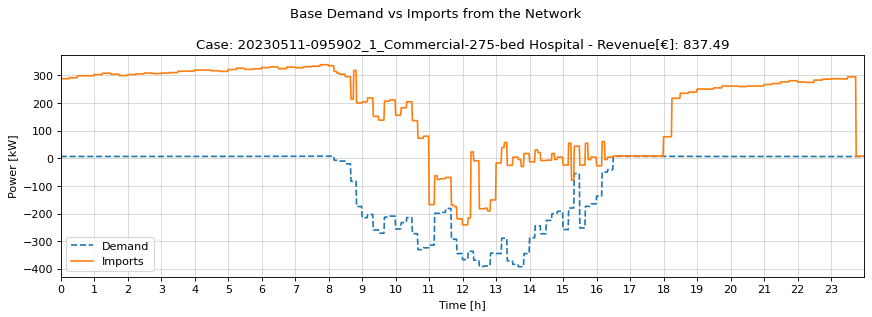

In [7]:
hours = simulation_time_series_resolution_in_hours * np.arange(number_of_time_intervals_per_day)
max_time = max(hours)
figure = plt.figure(num=None, figsize=(11, 4), dpi=80, facecolor='w', edgecolor='k')
plt.plot(hours, data.active_power_demand_base_in_kilowatts[0], '--', label='Demand')
plt.plot(hours, data.market_active_power_in_kilowatts[0], label='Imports')
plt.suptitle('Base Demand vs Imports from the Network')
subtitle = 'Case: ' + str(data.FolderName[0]) + ' - ' + 'Revenue[€]: ' + str(data.revenue[0])
plt.title(subtitle)
plt.ylabel('Power [kW]')
plt.xlabel('Time [h]')
plt.xlim(0, max_time)
plt.xticks(np.arange(0, max_time, step=1))
plt.legend()
plt.grid(True, alpha=0.5)
plt.tight_layout()

In [8]:
list_columns = []
for column in data.columns:
    if isinstance(data[column][0], list):
        list_columns.append(column)

In [9]:
list_columns

['market_active_power_in_kilowatts',
 'market_reactive_power_in_kilovolt_ampere_reactive',
 'active_power_demand_in_kilowatts',
 'active_power_demand_base_in_kilowatts',
 'imported_active_power_in_kilowatts',
 'exported_active_power_in_kilowatts',
 'building_power_consumption_in_kilowatts']

In [10]:
number_of_rows = data.shape[0]
number_of_rows

72

In [11]:
data.iloc[0]

FolderName                                                        20230511-095902_1_Commercial-275-bed Hospital
rated_photovoltaic_kilowatts                                                                                400
simulation_time_series_resolution_in_minutes                                                                  1
energy_management_system_time_series_resolution_in_minutes                                                   15
max_storage_asset_energy_in_kilowatt_hour                                                                   500
                                                                                    ...                        
revenue                                                                                                  837.49
active_power_demand_base_in_kilowatts                         [6.553400000000001, 6.553400000000001, 6.55340...
imported_active_power_in_kilowatts                            [[499.9999999981634], [499.9999999981608],

In [12]:
# for number_of_row in np.arange(0, number_of_rows):
#     row_data = data.iloc[number_of_row]
#     for list_column in list_columns:
#         figure = plt.figure(num=None, figsize=(15, 2), dpi=80, facecolor='w', edgecolor='k')
#         plt.plot(data[list_column][0])
#         case_name = row_data['FolderName']
#         plt.title(f'{case_name} - {list_column}');

In [13]:
data.shape

(72, 62)

In [16]:
number_of_columns = data.shape[1]
number_of_plots = number_of_rows * number_of_columns

In [18]:
# fig = plt.figure()
# for number_of_plot in np.arange(0, number_of_plots):
#     for number_of_row in np.arange(0, number_of_rows):
#         row_data = data.iloc[number_of_row]
#         for list_column in list_columns:
#             ax = fig.add_subplot(number_of_rows, number_of_columns, number_of_plot + 1)
#             ax.plot(row_data[list_column])

C:\Users\IkerDeLoma-Osorio\AppData\Local\Temp\ipykernel_11720\2011530891.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = fig.add_subplot(number_of_rows, number_of_columns, number_of_plot + 1)

KeyboardInterrupt



Error in callback <function flush_figures at 0x000001958D11A820> (for post_execute):



KeyboardInterrupt



C:\Users\IkerDeLoma-Osorio\AppData\Local\Temp\ipykernel_11720\3546177727.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = plt.figure(num=None, figsize=(15, 2), dpi=80, facecolor='w', edgecolor='k')


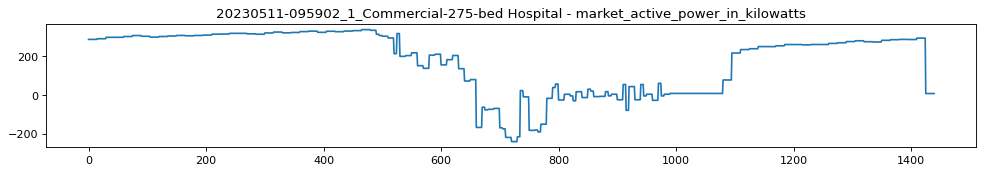

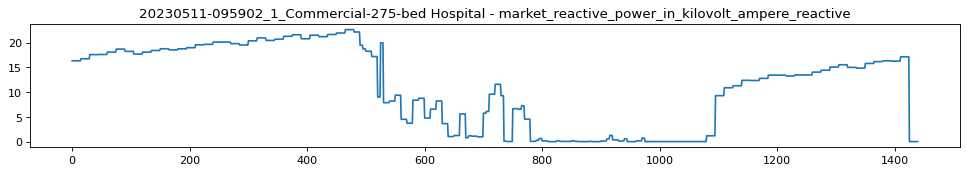

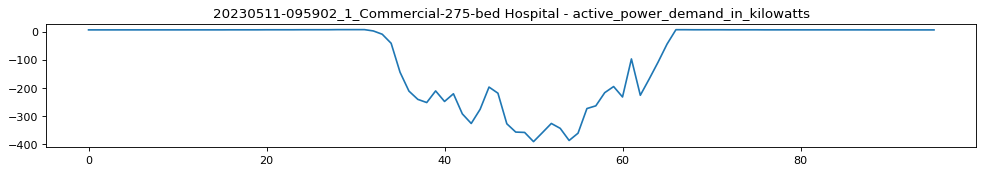

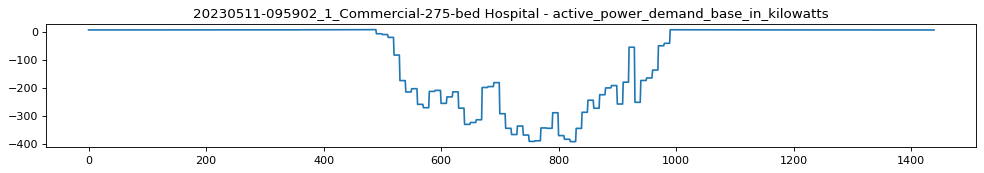

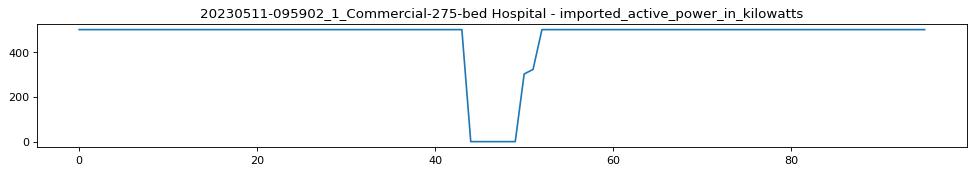

...

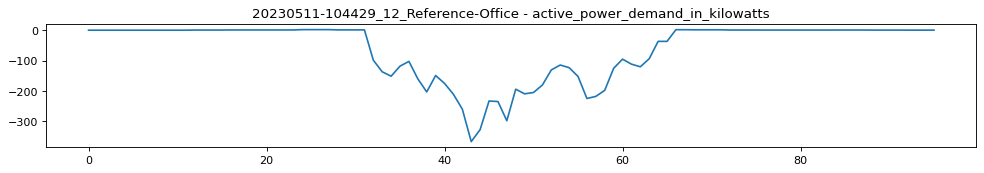

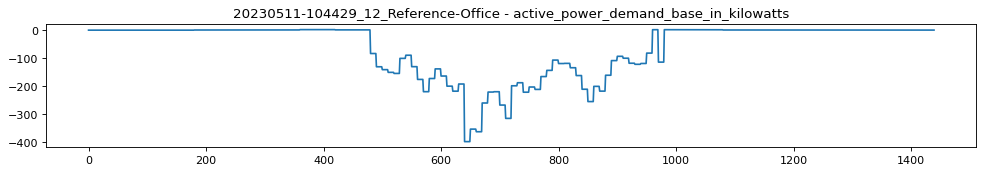

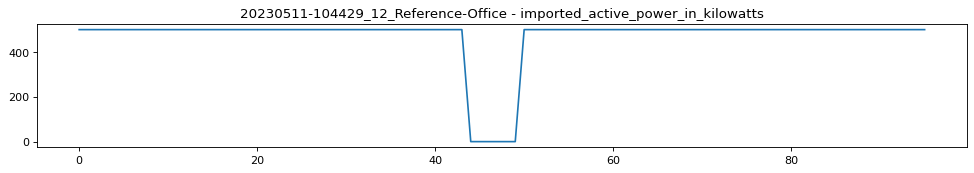

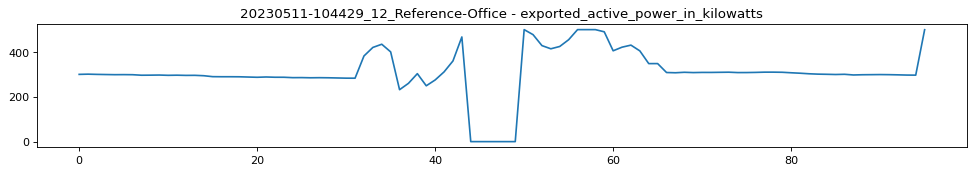

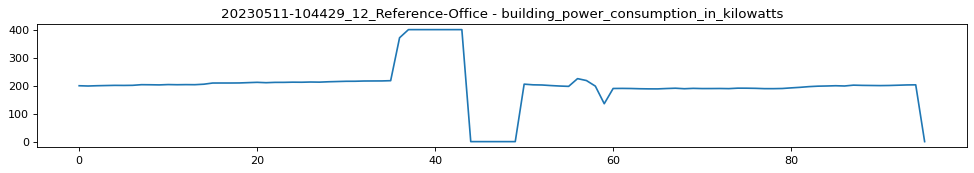

In [47]:
for number_of_row in np.arange(0, number_of_rows):
    row_data = data.iloc[number_of_row]
    for list_column in list_columns:
        figure = plt.figure(num=None, figsize=(15, 2), dpi=80, facecolor='w', edgecolor='k')
        plt.plot(row_data[list_column])
        case_name = row_data['FolderName']
        plt.title(f'{case_name} - {list_column}');

0     [288.1100621061704, 288.1100621061704, 288.110...
1     [190.20332931710308, 190.20332931710308, 190.2...
2     [98.3657717213743, 98.3657717213743, 98.365771...
3     [123.58075645120803, 123.58075645120803, 123.5...
4     [86.30505265465385, 86.30505265465385, 86.3050...
                            ...                        
67    [33.16031721570523, 33.16031721570523, 33.1603...
68    [13.482139790900773, 13.482139790900773, 13.48...
69    [147.14086291581245, 147.14086291581245, 147.1...
70    [145.46884905464503, 145.46884905464503, 145.4...
71    [222.55078315227965, 222.55078315227965, 222.5...
Name: market_active_power_in_kilowatts, Length: 72, dtype: object